In [1]:
import pandas as pd
import pandas_profiling.profile_report as report
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
%matplotlib inline
pd.set_option("display.Max_columns",None)
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import ExtraTreesClassifier,RandomForestClassifier,AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import RandomizedSearchCV,cross_val_score
from sklearn.feature_selection import SelectKBest,f_classif
from sklearn.preprocessing import StandardScaler,PowerTransformer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report


C:\Users\Gopal Kholade\AppData\Local\Temp\ipykernel_16464\649251384.py:2: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling.profile_report as report


In [2]:
churn = pd.read_csv("Data/telecom_customer_churn.csv")

In [3]:
churn.columns=churn.columns.str.lower().str.replace(" ","")

In [4]:
churn.head()


,customerid,gender,age,married,numberofdependents,city,zipcode,latitude,longitude,numberofreferrals,tenureinmonths,offer,phoneservice,avgmonthlylongdistancecharges,multiplelines,internetservice,internettype,avgmonthlygbdownload,onlinesecurity,onlinebackup,deviceprotectionplan,premiumtechsupport,streamingtv,streamingmovies,streamingmusic,unlimiteddata,contract,paperlessbilling,paymentmethod,monthlycharge,totalcharges,totalrefunds,totalextradatacharges,totallongdistancecharges,totalrevenue,customerstatus,churncategory,churnreason
0,0002-ORFBO,Female,37,Yes,0,Frazier Park,93225,34.827662,-118.999073,2,9,None,Yes,42.39,No,Yes,Cable,16.0,No,Yes,No,Yes,Yes,No,No,Yes,One Year,Yes,Credit Card,65.6,593.30,0.00,0,381.51,974.81,Stayed,NaN,NaN
1,0003-MKNFE,Male,46,No,0,Glendale,91206,34.162515,-118.203869,0,9,None,Yes,10.69,Yes,Yes,Cable,10.0,No,No,No,No,No,Yes,Yes,No,Month-to-Month,No,Credit Card,-4.0,542.40,38.33,10,96.21,610.28,Stayed,NaN,NaN
2,0004-TLHLJ,Male,50,No,0,Costa Mesa,92627,33.645672,-117.922613,0,4,Offer E,Yes,33.65,No,Yes,Fiber Optic,30.0,No,No,Yes,No,No,No,No,Yes,Month-to-Month,Yes,Bank Withdrawal,73.9,280.85,0.00,0,134.60,415.45,Churned,Competitor,Competitor had better devices
3,0011-IGKFF,Male,78,Yes,0,Martinez,94553,38.014457,-122.115432,1,13,Offer D,Yes,27.82,No,Yes,Fiber Optic,4.0,No,Yes,Yes,No,Yes,Yes,No,Yes,Month-to-Month,Yes,Bank Withdrawal,98.0,1237.85,0.00,0,361.66,1599.51,Churned,Dissatisfaction,Product dissatisfaction
4,0013-EXCHZ,Female,75,Yes,0,Camarillo,93010,34.227846,-119.079903,3,3,None,Yes,7.38,No,Yes,Fiber Optic,11.0,No,No,No,Yes,Yes,No,No,Yes,Month-to-Month,Yes,Credit Card,83.9,267.40,0.00,0,22.14,289.54,Churned,Dissatisfaction,Network reliability


In [5]:
churn.shape

(7043, 38)

In [6]:
churn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 38 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   customerid                     7043 non-null   object 
 1   gender                         7043 non-null   object 
 2   age                            7043 non-null   int64  
 3   married                        7043 non-null   object 
 4   numberofdependents             7043 non-null   int64  
 5   city                           7043 non-null   object 
 6   zipcode                        7043 non-null   int64  
 7   latitude                       7043 non-null   float64
 8   longitude                      7043 non-null   float64
 9   numberofreferrals              7043 non-null   int64  
 10  tenureinmonths                 7043 non-null   int64  
 11  offer                          7043 non-null   object 
 12  phoneservice                   7043 non-null   o

In [7]:
data_dic=pd.read_csv("./Data/telecom_data_dictionary.csv",encoding_errors="ignore")

In [12]:
for i in data_dic.iloc[:,1:].values:
    print(i[0],end=",")

CustomerID,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Customer Status,Churn Category,Churn Reason,Zip Code,Population,

In [9]:
churn.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
churn.isnull().sum()

customerid                          0
gender                              0
age                                 0
married                             0
numberofdependents                  0
city                                0
zipcode                             0
latitude                            0
longitude                           0
numberofreferrals                   0
tenureinmonths                      0
offer                               0
phoneservice                        0
avgmonthlylongdistancecharges     682
multiplelines                     682
internetservice                     0
internettype                     1526
avgmonthlygbdownload             1526
onlinesecurity                   1526
onlinebackup                     1526
deviceprotectionplan             1526
premiumtechsupport               1526
streamingtv                      1526
streamingmovies                  1526
streamingmusic                   1526
unlimiteddata                    1526
contract    

In [11]:
churn.columns

Index(['customerid', 'gender', 'age', 'married', 'numberofdependents', 'city',
       'zipcode', 'latitude', 'longitude', 'numberofreferrals',
       'tenureinmonths', 'offer', 'phoneservice',
       'avgmonthlylongdistancecharges', 'multiplelines', 'internetservice',
       'internettype', 'avgmonthlygbdownload', 'onlinesecurity',
       'onlinebackup', 'deviceprotectionplan', 'premiumtechsupport',
       'streamingtv', 'streamingmovies', 'streamingmusic', 'unlimiteddata',
       'contract', 'paperlessbilling', 'paymentmethod', 'monthlycharge',
       'totalcharges', 'totalrefunds', 'totalextradatacharges',
       'totallongdistancecharges', 'totalrevenue', 'customerstatus',
       'churncategory', 'churnreason'],
      dtype='object')

In [12]:
churn.isnull().sum()

customerid                          0
gender                              0
age                                 0
married                             0
numberofdependents                  0
city                                0
zipcode                             0
latitude                            0
longitude                           0
numberofreferrals                   0
tenureinmonths                      0
offer                               0
phoneservice                        0
avgmonthlylongdistancecharges     682
multiplelines                     682
internetservice                     0
internettype                     1526
avgmonthlygbdownload             1526
onlinesecurity                   1526
onlinebackup                     1526
deviceprotectionplan             1526
premiumtechsupport               1526
streamingtv                      1526
streamingmovies                  1526
streamingmusic                   1526
unlimiteddata                    1526
contract    

In [13]:
churn=churn.drop(['churncategory', 'churnreason'],axis=1)

In [14]:
churn[churn["phoneservice"]=="No"].head()

,customerid,gender,age,married,numberofdependents,city,zipcode,latitude,longitude,numberofreferrals,tenureinmonths,offer,phoneservice,avgmonthlylongdistancecharges,multiplelines,internetservice,internettype,avgmonthlygbdownload,onlinesecurity,onlinebackup,deviceprotectionplan,premiumtechsupport,streamingtv,streamingmovies,streamingmusic,unlimiteddata,contract,paperlessbilling,paymentmethod,monthlycharge,totalcharges,totalrefunds,totalextradatacharges,totallongdistancecharges,totalrevenue,customerstatus
10,0017-DINOC,Male,47,No,0,Rancho Santa Fe,92091,32.993560,-117.207121,0,54,None,No,NaN,NaN,Yes,Cable,10.0,Yes,No,No,Yes,Yes,No,No,Yes,Two Year,No,Credit Card,45.20,2460.55,0.0,0,0.0,2460.55,Stayed
14,0019-GFNTW,Female,39,No,0,Los Olivos,93441,34.704340,-120.026090,0,56,None,No,NaN,NaN,Yes,DSL,19.0,Yes,Yes,Yes,Yes,No,No,No,Yes,Two Year,No,Bank Withdrawal,45.05,2560.10,0.0,0,0.0,2560.10,Stayed
16,0020-JDNXP,Female,52,Yes,1,Point Reyes Station,94956,38.060264,-122.830646,0,34,None,No,NaN,NaN,Yes,DSL,20.0,Yes,No,Yes,Yes,Yes,Yes,Yes,Yes,One Year,No,Credit Card,61.25,1993.20,0.0,0,0.0,1993.20,Stayed
19,0023-HGHWL,Male,67,No,0,Morgan Hill,95037,37.161544,-121.649371,0,1,None,No,NaN,NaN,Yes,Cable,9.0,No,No,No,No,No,No,No,Yes,Month-to-Month,Yes,Bank Withdrawal,25.10,25.10,0.0,0,0.0,25.10,Churned
25,0032-PGELS,Female,37,Yes,1,Palomar Mountain,92060,33.309852,-116.823091,1,1,None,No,NaN,NaN,Yes,DSL,19.0,Yes,No,No,No,No,No,No,Yes,Month-to-Month,No,Bank Withdrawal,30.50,30.50,0.0,0,0.0,30.50,Churned


In [15]:
no_phone=['avgmonthlylongdistancecharges', 'multiplelines']

In [16]:
churn[no_phone]=churn[no_phone].fillna(0)

In [17]:
churn.isnull().sum()

customerid                          0
gender                              0
age                                 0
married                             0
numberofdependents                  0
city                                0
zipcode                             0
latitude                            0
longitude                           0
numberofreferrals                   0
tenureinmonths                      0
offer                               0
phoneservice                        0
avgmonthlylongdistancecharges       0
multiplelines                       0
internetservice                     0
internettype                     1526
avgmonthlygbdownload             1526
onlinesecurity                   1526
onlinebackup                     1526
deviceprotectionplan             1526
premiumtechsupport               1526
streamingtv                      1526
streamingmovies                  1526
streamingmusic                   1526
unlimiteddata                    1526
contract    

In [18]:
import datetime

In [19]:
print(datetime.date.today())

2023-07-04


In [20]:
churn.to_csv(f"churn {datetime.date.today()}.csv",index=False)

In [21]:
churn=churn.drop("customerid",axis=1)

In [22]:
churn.dtypes

gender                            object
age                                int64
married                           object
numberofdependents                 int64
city                              object
zipcode                            int64
latitude                         float64
longitude                        float64
numberofreferrals                  int64
tenureinmonths                     int64
offer                             object
phoneservice                      object
avgmonthlylongdistancecharges    float64
multiplelines                     object
internetservice                   object
internettype                      object
avgmonthlygbdownload             float64
onlinesecurity                    object
onlinebackup                      object
deviceprotectionplan              object
premiumtechsupport                object
streamingtv                       object
streamingmovies                   object
streamingmusic                    object
unlimiteddata   

In [23]:
obj=churn.select_dtypes(include="object").columns.to_list()
num=churn.select_dtypes(exclude="object").columns.to_list()

In [24]:
print(f"Number of Numerical Variables: {len(num)}")
print(f"Number of Object Variables: {len(obj)}")

Number of Numerical Variables: 15
Number of Object Variables: 20


In [25]:
no_inter=['internettype', 'avgmonthlygbdownload', 'onlinesecurity',
       'onlinebackup', 'deviceprotectionplan', 'premiumtechsupport',
       'streamingtv', 'streamingmovies', 'streamingmusic', 'unlimiteddata']

In [26]:
for i in no_inter:
    if i in obj:
        churn[i]=churn[i].fillna("NA")
    elif i in num:
        churn[i]=churn[i].fillna(0).astype(float)

In [27]:
# furthe classify obj into binary and multi-dimentional
uniques={}
nuniques={}
for i in obj:
    uniques[i]=churn[i].unique()
    nuniques[i]=churn[i].nunique()

In [28]:
churn.dtypes

gender                            object
age                                int64
married                           object
numberofdependents                 int64
city                              object
zipcode                            int64
latitude                         float64
longitude                        float64
numberofreferrals                  int64
tenureinmonths                     int64
offer                             object
phoneservice                      object
avgmonthlylongdistancecharges    float64
multiplelines                     object
internetservice                   object
internettype                      object
avgmonthlygbdownload             float64
onlinesecurity                    object
onlinebackup                      object
deviceprotectionplan              object
premiumtechsupport                object
streamingtv                       object
streamingmovies                   object
streamingmusic                    object
unlimiteddata   

In [29]:
churn[churn["internetservice"]=="No"].head()

,gender,age,married,numberofdependents,city,zipcode,latitude,longitude,numberofreferrals,tenureinmonths,offer,phoneservice,avgmonthlylongdistancecharges,multiplelines,internetservice,internettype,avgmonthlygbdownload,onlinesecurity,onlinebackup,deviceprotectionplan,premiumtechsupport,streamingtv,streamingmovies,streamingmusic,unlimiteddata,contract,paperlessbilling,paymentmethod,monthlycharge,totalcharges,totalrefunds,totalextradatacharges,totallongdistancecharges,totalrevenue,customerstatus
20,Female,79,Yes,0,Ahwahnee,93601,37.375816,-119.739935,0,50,None,Yes,31.43,Yes,No,NA,0.0,NA,NA,NA,NA,NA,NA,NA,NA,One Year,No,Bank Withdrawal,25.20,1306.30,0.00,0,1571.50,2877.80,Stayed
23,Female,22,No,0,Keeler,93530,36.560498,-117.962461,0,3,None,Yes,3.12,No,No,NA,0.0,NA,NA,NA,NA,NA,NA,NA,NA,Month-to-Month,No,Credit Card,19.85,57.20,0.00,0,9.36,66.56,Joined
24,Female,34,Yes,0,Korbel,95550,40.766600,-123.804580,0,4,Offer E,Yes,12.43,No,No,NA,0.0,NA,NA,NA,NA,NA,NA,NA,NA,Month-to-Month,No,Credit Card,20.35,76.35,0.00,0,49.72,126.07,Churned
27,Male,42,Yes,3,Modesto,95358,37.612612,-121.108568,3,54,None,Yes,19.70,No,No,NA,0.0,NA,NA,NA,NA,NA,NA,NA,NA,Two Year,No,Credit Card,20.40,1090.60,0.00,0,1063.80,2154.40,Stayed
28,Male,64,No,0,Glen Ellen,95442,38.368744,-122.522642,0,26,Offer C,Yes,37.70,No,No,NA,0.0,NA,NA,NA,NA,NA,NA,NA,NA,One Year,Yes,Bank Withdrawal,19.60,471.85,21.25,0,980.20,1430.80,Stayed


In [30]:
churn.describe()

,age,numberofdependents,zipcode,latitude,longitude,numberofreferrals,tenureinmonths,avgmonthlylongdistancecharges,avgmonthlygbdownload,monthlycharge,totalcharges,totalrefunds,totalextradatacharges,totallongdistancecharges,totalrevenue
count,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000
mean,46.509726,0.468692,93486.070567,36.197455,-119.756684,1.951867,32.386767,22.958954,20.515405,63.596131,2280.381264,1.962182,6.860713,749.099262,3034.379056
std,16.750352,0.962802,1856.767505,2.468929,2.154425,3.001199,24.542061,15.448113,20.418940,31.204743,2266.220462,7.902614,25.104978,846.660055,2865.204542
min,19.000000,0.000000,90001.000000,32.555828,-124.301372,0.000000,1.000000,0.000000,0.000000,-10.000000,18.800000,0.000000,0.000000,0.000000,21.360000
25%,32.000000,0.000000,92101.000000,33.990646,-121.788090,0.000000,9.000000,9.210000,3.000000,30.400000,400.150000,0.000000,0.000000,70.545000,605.610000
50%,46.000000,0.000000,93518.000000,36.205465,-119.595293,0.000000,29.000000,22.890000,17.000000,70.050000,1394.550000,0.000000,0.000000,401.440000,2108.640000
75%,60.000000,0.000000,95329.000000,38.161321,-117.969795,3.000000,55.000000,36.395000,27.000000,89.750000,3786.600000,0.000000,0.000000,1191.100000,4801.145000
max,80.000000,9.000000,96150.000000,41.962127,-114.192901,11.000000,72.000000,49.990000,85.000000,118.750000,8684.800000,49.790000,150.000000,3564.720000,11979.340000


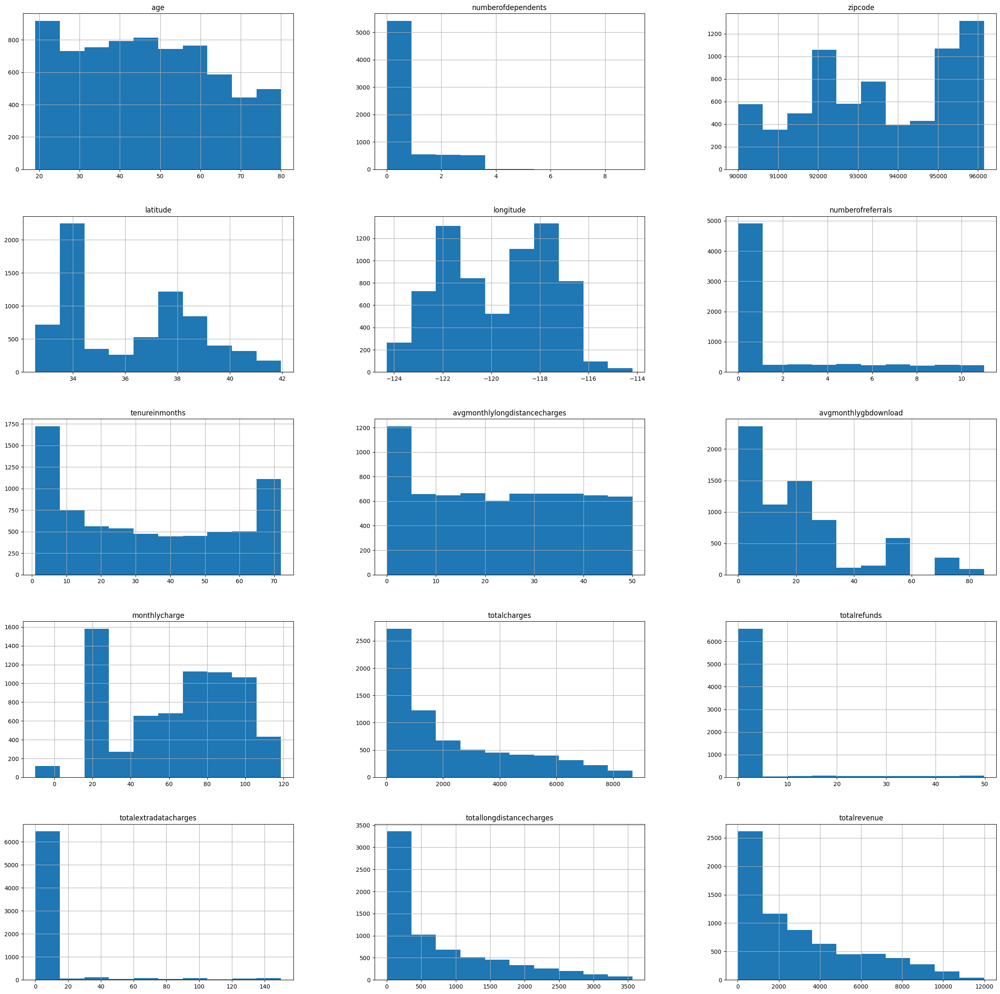

In [31]:
churn.hist(figsize=(30,30),layout=(5,3))
plt.show()

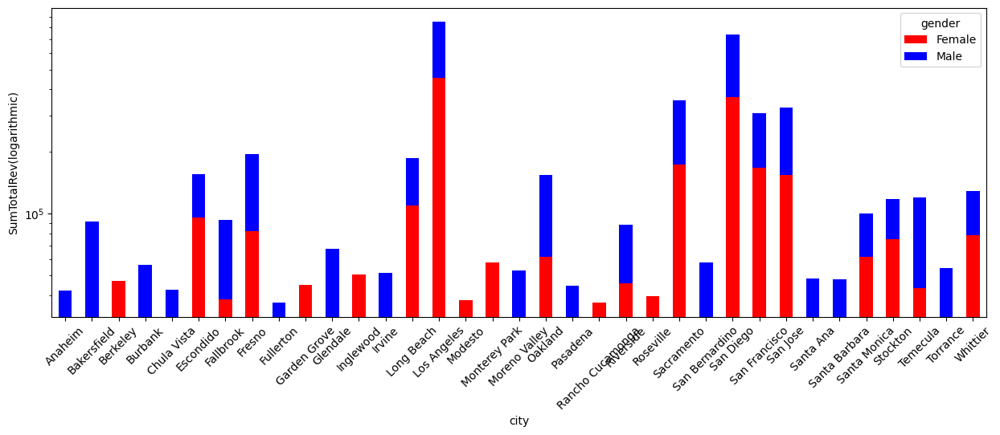

In [32]:
churn.groupby(["city","gender"])["totalrevenue"].sum().nlargest(50).sort_values().unstack().plot(figsize=(15,5),rot=45,kind="bar",stacked=True,color=["red","blue"],grid=False)
plt.ylabel("SumTotalRev(logarithmic)")
plt.yscale("log")
plt.show()

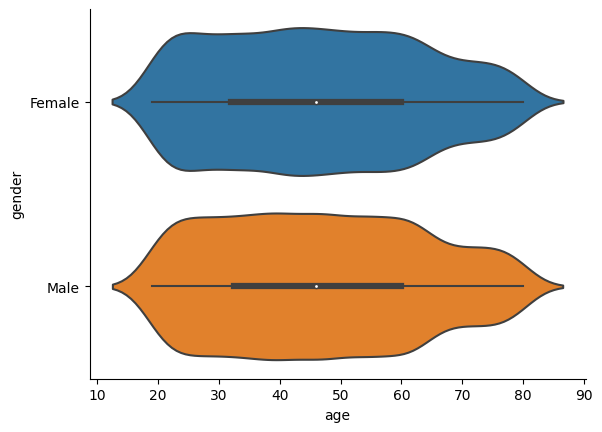

In [33]:
sns.violinplot(x=churn["age"],y=churn["gender"])
sns.despine()

<Axes: xlabel='avgmonthlylongdistancecharges', ylabel='customerstatus'>

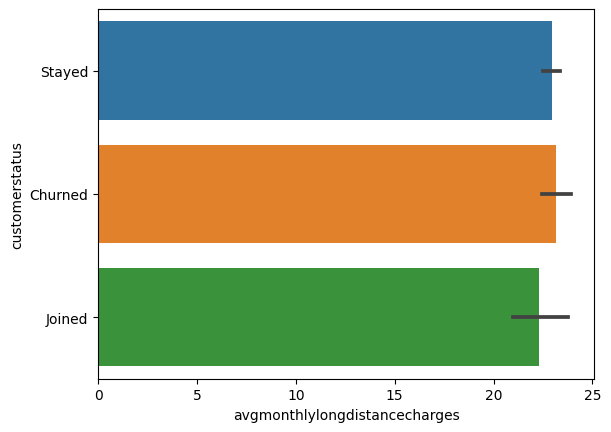

In [34]:
sns.barplot(x=churn["avgmonthlylongdistancecharges"],y=churn["customerstatus"])

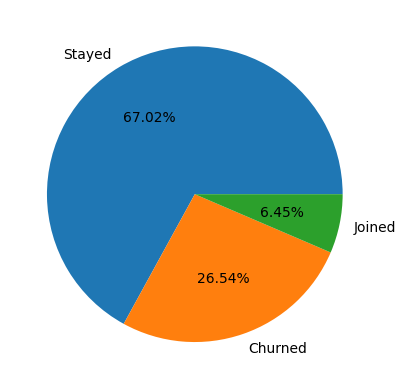

In [35]:
plt.pie(churn["customerstatus"].value_counts(),autopct="%.2f%%",labels=churn["customerstatus"].value_counts().index)
plt.show()

In [36]:
churn.columns

Index(['gender', 'age', 'married', 'numberofdependents', 'city', 'zipcode',
       'latitude', 'longitude', 'numberofreferrals', 'tenureinmonths', 'offer',
       'phoneservice', 'avgmonthlylongdistancecharges', 'multiplelines',
       'internetservice', 'internettype', 'avgmonthlygbdownload',
       'onlinesecurity', 'onlinebackup', 'deviceprotectionplan',
       'premiumtechsupport', 'streamingtv', 'streamingmovies',
       'streamingmusic', 'unlimiteddata', 'contract', 'paperlessbilling',
       'paymentmethod', 'monthlycharge', 'totalcharges', 'totalrefunds',
       'totalextradatacharges', 'totallongdistancecharges', 'totalrevenue',
       'customerstatus'],
      dtype='object')

<Axes: ylabel='customerstatus,offer'>

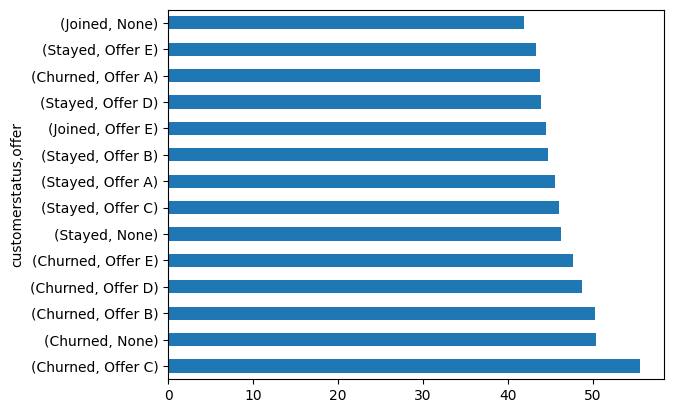

In [37]:
churn.groupby(["customerstatus","offer"])["age"].mean().sort_values(ascending=False).plot(kind="barh")

In [38]:
nuniques

{'gender': 2,
 'married': 2,
 'city': 1106,
 'offer': 6,
 'phoneservice': 2,
 'multiplelines': 3,
 'internetservice': 2,
 'internettype': 4,
 'onlinesecurity': 3,
 'onlinebackup': 3,
 'deviceprotectionplan': 3,
 'premiumtechsupport': 3,
 'streamingtv': 3,
 'streamingmovies': 3,
 'streamingmusic': 3,
 'unlimiteddata': 3,
 'contract': 3,
 'paperlessbilling': 2,
 'paymentmethod': 3,
 'customerstatus': 3}

In [39]:
ord_c=[]
ohe_c=[]
for i in nuniques:
    if nuniques[i]<3:
        ord_c.append(i)
    else:
        if i!="city":
            ohe_c.append(i)

In [40]:
ord_c

['gender', 'married', 'phoneservice', 'internetservice', 'paperlessbilling']

In [41]:
ohe_c

['offer',
 'multiplelines',
 'internettype',
 'onlinesecurity',
 'onlinebackup',
 'deviceprotectionplan',
 'premiumtechsupport',
 'streamingtv',
 'streamingmovies',
 'streamingmusic',
 'unlimiteddata',
 'contract',
 'paymentmethod',
 'customerstatus']

In [42]:
pd.DataFrame(churn.groupby("customerstatus")["city"].value_counts())

city
customerstatus city                
Churned        San Diego        185
               Los Angeles       78
               San Francisco     31
               San Jose          29
               Fallbrook         26
...                             ...
Stayed         Trinity Center     1
               Tujunga            1
               Union City         1
               Wheatland          1
               Woody              1

[2194 rows x 1 columns]

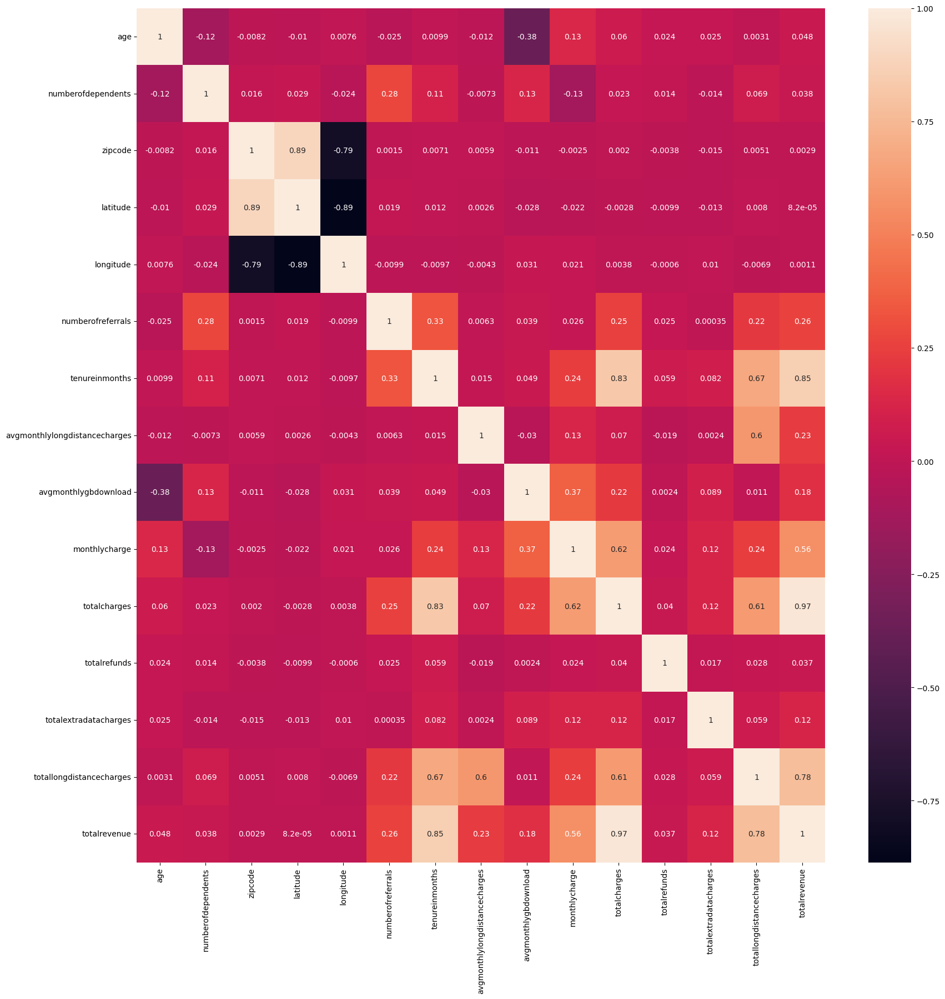

In [43]:
plt.figure(figsize=(20,20))
sns.heatmap(churn.corr(),annot=True)
plt.show()

In [44]:
import category_encoders as ce

In [45]:
enc=ce.TargetEncoder(cols=["city","zipcode"])

In [46]:
test=churn.copy()

In [47]:
x=test.drop("customerstatus",axis=1)
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
y=test.customerstatus
y=le.fit_transform(y)


In [48]:
x=enc.fit_transform(x,y)

In [49]:
ohe_c.remove("customerstatus")

In [50]:
ohe=ce.OneHotEncoder(cols=ohe_c)
x=ohe.fit_transform(x,y)

In [51]:
ord=ce.OrdinalEncoder(cols=ord_c)
x=ord.fit_transform(x,y)

In [52]:
x=x.drop(["latitude","longitude"],axis=1)

In [48]:
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=40,test_size=.30,stratify=y)

In [55]:
pow=PowerTransformer()
sc=StandardScaler()
x_train=sc.fit_transform(x_train)
x_train=pow.fit_transform(x_train,y_train)
x_test=sc.transform(x_test)
x_test=pow.transform(x_test)


In [57]:
selbe=SelectKBest(score_func=f_classif,k=59)
selbe.fit(x_train,y_train)

SelectKBest(k=59)

In [58]:
fet_imp=pd.Series(selbe.scores_,x.columns)
fet_imp.sort_values(ascending=False)

tenureinmonths                   1028.340326
contract_2                        886.583829
zipcode                           880.559858
totalrevenue                      656.770717
totalcharges                      551.330962
                                    ...     
phoneservice                        2.329315
multiplelines_3                     2.329315
gender                              1.343473
avgmonthlylongdistancecharges       0.061422
internettype_1                      0.018010
Length: 62, dtype: float64

In [59]:
x_train=selbe.transform(x_train)
x_test=selbe.transform(x_test)

In [61]:
models=[ExtraTreesClassifier(),RandomForestClassifier(),AdaBoostClassifier(),LogisticRegression(),SVC(),DecisionTreeClassifier(),XGBClassifier()]
scores={}
for model in models:
    try:
        val=cross_val_score(model,x_train,y_train,cv=5,n_jobs=4)
        scores[model]=val
    except:
        scores[model]=[0,0,0,0,0]

In [62]:
for i in scores.keys():
    print(i,np.mean(scores[i]))

ExtraTreesClassifier() 0.8553752535496958
RandomForestClassifier() 0.875050709939148
AdaBoostClassifier() 0.7551724137931035
LogisticRegression() 0.8600405679513186
SVC() 0.8476673427991888
DecisionTreeClassifier() 0.8356997971602433
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...) 0.880527383367

Now with above experimentation it is clear that XGBClassifier is the best estimator

In [63]:
param={"booster":["gbtree","gblinear","dart"],
       "n_estimators":np.arange(1000,5000,1000),
       "num_parallel_tree":np.arange(1,7,2),
       "learning_rate":np.arange(0.3,1.3,0.3)}

In [77]:
rsercv=RandomizedSearchCV(estimator=XGBClassifier(),param_distributions=param,verbose=1,cv=5,n_jobs=4,)
rsercv.fit(x_train,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


In [64]:
xgb=XGBClassifier(booster="dart",n_estimators=3000,num_parallel_trees=3,learning_rate=0.7)

In [65]:
xgb.fit(x_train,y_train)

[10:38:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "num_parallel_trees" } are not used.



XGBClassifier(base_score=None, booster='dart', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.7, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=3000, n_jobs=None, num_parallel_tree=None,
              num_parallel_trees=3, objective='multi:softprob', ...)

In [66]:
y_pred=xgb.predict(x_test)

In [67]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.81      0.79      0.80       561
           1       0.84      0.79      0.82       136
           2       0.93      0.94      0.94      1416

    accuracy                           0.89      2113
   macro avg       0.86      0.84      0.85      2113
weighted avg       0.89      0.89      0.89      2113



In [72]:
import pickle
with open("model.pkl","wb") as fd:
    fd.write(pickle.dumps(xgb))

In [74]:
with open("model.pkl","rb") as fd:
    model=pickle.loads(fd.read())

### Pipeline

In [49]:
ct=ColumnTransformer([("targetencoder",ce.TargetEncoder(),["city","zipcode"]),("oheencoder",ce.OneHotEncoder(),['offer','multiplelines','internettype','onlinesecurity','onlinebackup','deviceprotectionplan','premiumtechsupport','streamingtv','streamingmovies','streamingmusic','unlimiteddata','contract','paymentmethod']),("ordencoder",ce.OrdinalEncoder(),['gender', 'married', 'phoneservice', 'internetservice', 'paperlessbilling'])],remainder="passthrough")

In [50]:
modelpipe=Pipeline([("Transformer",ct),("scalerTarnsformer",StandardScaler()),("powertrans",PowerTransformer()),("kbest",SelectKBest(score_func=f_classif,k=60)),("model",XGBClassifier(n_estimators=3000,num_parallel_trees=3,learning_rate=0.7))])

In [51]:
modelpipe.fit(x_train,y_train)

[22:57:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "num_parallel_trees" } are not used.



Pipeline(steps=[('Transformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('targetencoder',
                                                  TargetEncoder(),
                                                  ['city', 'zipcode']),
                                                 ('oheencoder', OneHotEncoder(),
                                                  ['offer', 'multiplelines',
                                                   'internettype',
                                                   'onlinesecurity',
                                                   'onlinebackup',
                                                   'deviceprotectionplan',
                                                   'premiumtechsupport',
                                                   'streamingtv',
                                                   'streamingmovies',
                                                   'streamingmusic',
                                                   'unlimiteddata'...
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None, learning_rate=0.7,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, n_estimators=3000,
                               n_jobs=None, num_parallel_tree=None,
                               num_parallel_trees=3, objective='multi:softprob', ...))])

In [52]:
y_pred=modelpipe.predict(x_test)

In [53]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.69      0.59      0.63       561
           1       0.61      0.62      0.62       136
           2       0.88      0.93      0.90      1416

    accuracy                           0.82      2113
   macro avg       0.73      0.71      0.72      2113
weighted avg       0.81      0.82      0.81      2113

